In [1]:
from yahoo_fin.stock_info import get_data
from datetime import date
import plotly.express as px
import pandas as pd
import numpy as np
from pathlib import Path
import csv
import seaborn as sns
import plotly.graph_objects as go
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import panel as pn
from panel.interact import interact
from MCForecastTools import MCSimulation
pn.extension("plotly")
%matplotlib inline


today = date.today()
spy = get_data("spy", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
xle = get_data("xle", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
xlf = get_data("xlf", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
gold = get_data("GLD", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
tlt = get_data("tlt", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")
usd = get_data("dx-y.nyb", start_date="01/03/2016", end_date=today, index_as_date = True, interval="1d")


In [2]:
usd.fillna(method='bfill', inplace=True)
usd.head()

,open,high,low,close,adjclose,volume,ticker
2016-01-04,98.690002,99.180000,98.050003,98.870003,98.870003,0.0,DX-Y.NYB
2016-01-05,98.870003,99.629997,98.750000,99.400002,99.400002,0.0,DX-Y.NYB
2016-01-06,99.389999,99.580002,99.110001,99.180000,99.180000,0.0,DX-Y.NYB
2016-01-07,99.220001,99.300003,98.169998,98.220001,98.220001,0.0,DX-Y.NYB
2016-01-08,98.309998,99.180000,98.269997,98.540001,98.540001,0.0,DX-Y.NYB


In [3]:
# @TODO: Set file paths for btc_data.csv and eth_data.csv
btc_filepath = Path('Resources/BTC-USD.csv')
btc_df = pd.read_csv(btc_filepath, index_col="Date", infer_datetime_format=True, parse_dates=True)

btc_df.head()


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [4]:
btc_df.sort_index(inplace=True)
btc_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [5]:
eth_filepath = Path('Resources/ETH-USD.csv')
eth_df = pd.read_csv(eth_filepath, index_col="Date", infer_datetime_format=True, parse_dates=True)

eth_df.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-08-07,2.831620,3.536610,2.521120,2.772120,2.772120,164329.0
2015-08-08,2.793760,2.798810,0.714725,0.753325,0.753325,674188.0
2015-08-09,0.706136,0.879810,0.629191,0.701897,0.701897,532170.0
2015-08-10,0.713989,0.729854,0.636546,0.708448,0.708448,405283.0
2015-08-11,0.708087,1.131410,0.663235,1.067860,1.067860,1463100.0


In [6]:
#fig = px.line(spy['close'], labels={ 'close' : 'SPY CLOSE'})
#fig.show()

In [7]:
#gold.head()

In [8]:
#dxy = get_data("dxy", start_date="01/03/2015", end_date=today, index_as_date = True, interval="1d")
#dxy['close'].plot(figsize=(20,10))

In [9]:
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

combined_df = pd.concat([btc_df['Close'], eth_df['Close'], spy['close'], gold['close'], tlt['close'], usd['close'], xle['close'], xlf['close'],], axis="columns", join="inner")
combined_df.columns = column
combined_df.head()

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
2016-01-04,433.091003,0.954480,201.020004,102.889999,121.449997,98.870003,60.299999,18.984566
2016-01-05,431.959991,0.950176,201.360001,103.180000,120.959999,99.400002,60.529999,19.057676
2016-01-06,429.105011,0.950860,198.820007,104.669998,122.589996,99.180000,58.200001,18.765232
2016-01-07,458.048004,0.942005,194.050003,106.150002,122.809998,98.220001,56.779999,18.237206
2016-01-08,453.230011,0.986789,191.919998,105.680000,123.360001,98.540001,56.049999,17.952885


In [10]:
combined_df.isnull().sum()

BTC    5
ETH    5
SPY    0
TLT    0
GLD    0
USD    0
XLE    0
XLF    0
dtype: int64

In [11]:
combined_df.head()

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
2016-01-04,433.091003,0.954480,201.020004,102.889999,121.449997,98.870003,60.299999,18.984566
2016-01-05,431.959991,0.950176,201.360001,103.180000,120.959999,99.400002,60.529999,19.057676
2016-01-06,429.105011,0.950860,198.820007,104.669998,122.589996,99.180000,58.200001,18.765232
2016-01-07,458.048004,0.942005,194.050003,106.150002,122.809998,98.220001,56.779999,18.237206
2016-01-08,453.230011,0.986789,191.919998,105.680000,123.360001,98.540001,56.049999,17.952885


In [12]:
portfolio_returns  = combined_df.dropna()

In [13]:
portfolio_returns.isnull().sum()

BTC    0
ETH    0
SPY    0
TLT    0
GLD    0
USD    0
XLE    0
XLF    0
dtype: int64

In [14]:
portfolio_returns = portfolio_returns.pct_change()

In [15]:
portfolio_returns  = portfolio_returns.dropna()

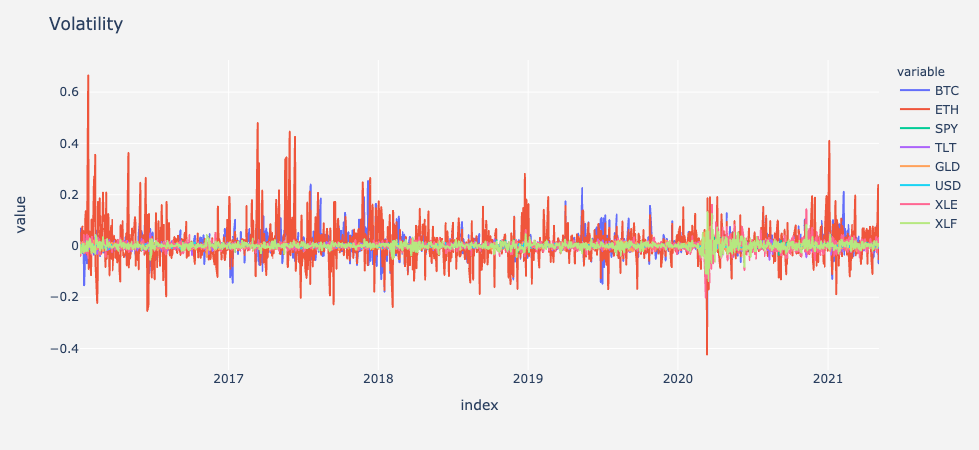

In [16]:
port_returns_fig = px.line(portfolio_returns)
port_returns_fig.update_layout(
    title='Volatility',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
port_returns_fig.show()

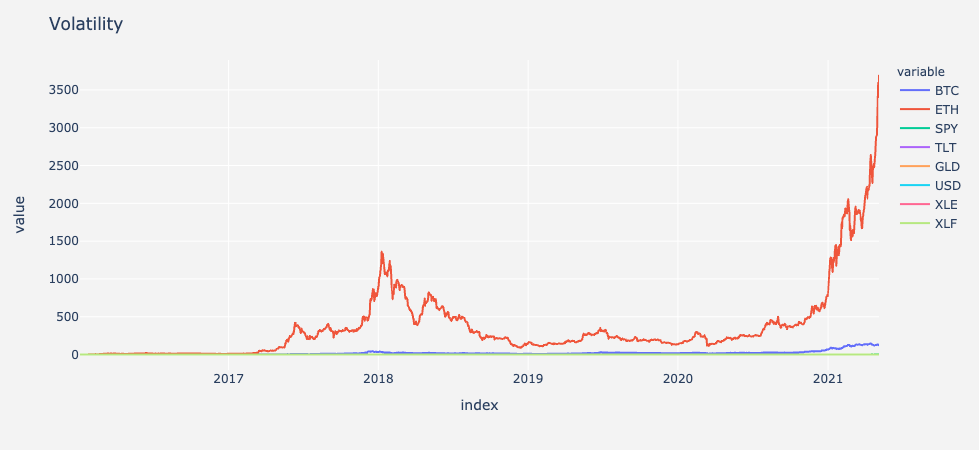

In [17]:
# Calculate cumulative returns of all portfolios
cumulative_returns = (1 + portfolio_returns).cumprod()
# Plot cumulative returns
volatility_fig = px.line(cumulative_returns)
volatility_fig.update_layout(
    title='Volatility',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
volatility_fig.show()

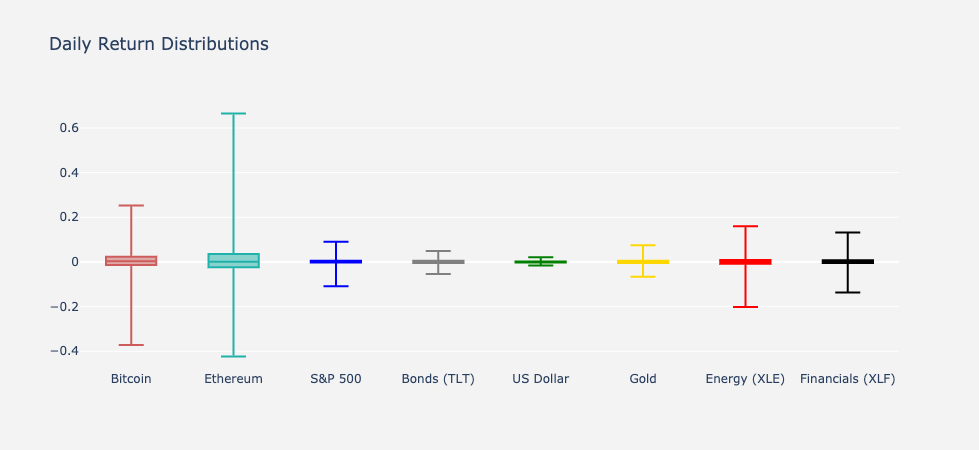

In [18]:
vol_box_fig = go.Figure()
vol_box_fig.add_trace(go.Box(y=portfolio_returns['BTC'], name='Bitcoin',
                marker_color = 'indianred', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['ETH'], name = 'Ethereum',
                marker_color = 'lightseagreen', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['SPY'], name='S&P 500',
                marker_color = 'blue', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['TLT'], name = 'Bonds (TLT)',
                marker_color = 'grey', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['USD'], name = 'US Dollar',
                marker_color = 'green', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['GLD'], name='Gold',
                marker_color = 'gold', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['XLE'], name = 'Energy (XLE)',
                marker_color = 'red', boxpoints=False))
vol_box_fig.add_trace(go.Box(y=portfolio_returns['XLF'], name = 'Financials (XLF)',
                marker_color = 'black', boxpoints=False))

vol_box_fig.update_layout(
    title='Daily Return Distributions',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=False
)

vol_box_fig.show()

In [19]:
volatility = portfolio_returns.std()
volatility

BTC    0.047137
ETH    0.075322
SPY    0.011748
TLT    0.008836
GLD    0.008745
USD    0.003933
XLE    0.020558
XLF    0.015772
dtype: float64

In [20]:
volatility = portfolio_returns.std() * np.sqrt(252)
volatility

BTC    0.748274
ETH    1.195699
SPY    0.186500
TLT    0.140269
GLD    0.138819
USD    0.062440
XLE    0.326356
XLF    0.250374
dtype: float64

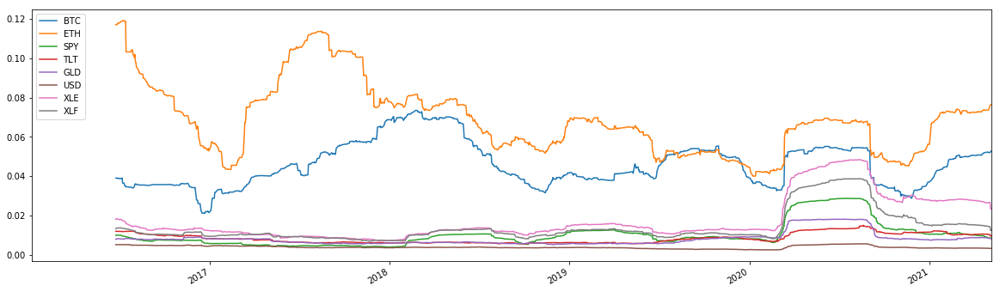

In [21]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
roll = portfolio_returns.rolling(window=120).std()
# Plot the rolling standard deviation
portfolio_returns.rolling(window=120).std().plot(figsize=(20,6))

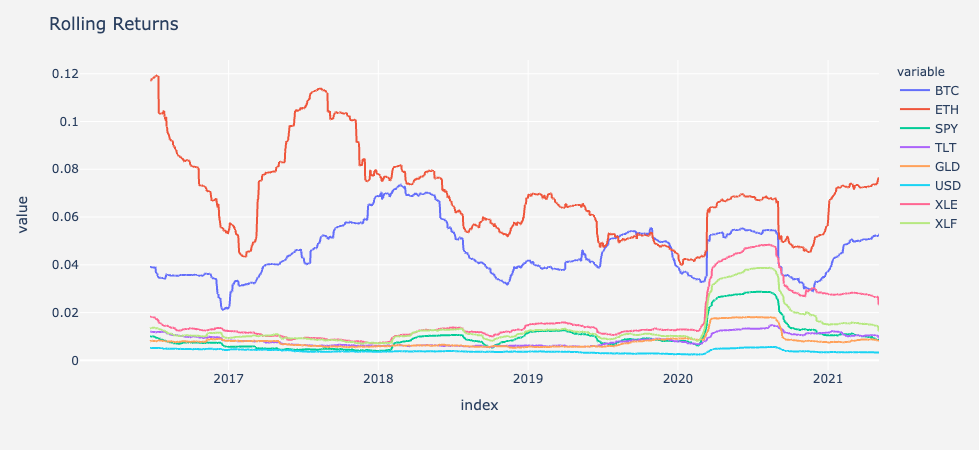

In [22]:
roll_120_fig = px.line(roll)
roll_120_fig.update_layout(
    title='Rolling Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
roll_120_fig.show()

In [23]:
# Calculate the correlation
price_correlation = portfolio_returns.corr()
# Display de correlation matrix
price_correlation

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
BTC,1.000000,0.519841,0.151997,0.115408,-0.038046,-0.024193,0.124296,0.142190
ETH,0.519841,1.000000,0.134332,0.105430,-0.017121,-0.045281,0.102589,0.113738
SPY,0.151997,0.134332,1.000000,-0.006043,-0.389974,-0.026650,0.713741,0.862439
TLT,0.115408,0.105430,-0.006043,1.000000,0.332616,-0.450105,-0.023653,-0.142062
GLD,-0.038046,-0.017121,-0.389974,0.332616,1.000000,-0.143608,-0.337888,-0.497931
USD,-0.024193,-0.045281,-0.026650,-0.450105,-0.143608,1.000000,-0.051125,0.017659
XLE,0.124296,0.102589,0.713741,-0.023653,-0.337888,-0.051125,1.000000,0.765009
XLF,0.142190,0.113738,0.862439,-0.142062,-0.497931,0.017659,0.765009,1.000000


In [24]:
# Use `ewm` to calculate the rolling window
ewm_calc = portfolio_returns.ewm(halflife=120).std()

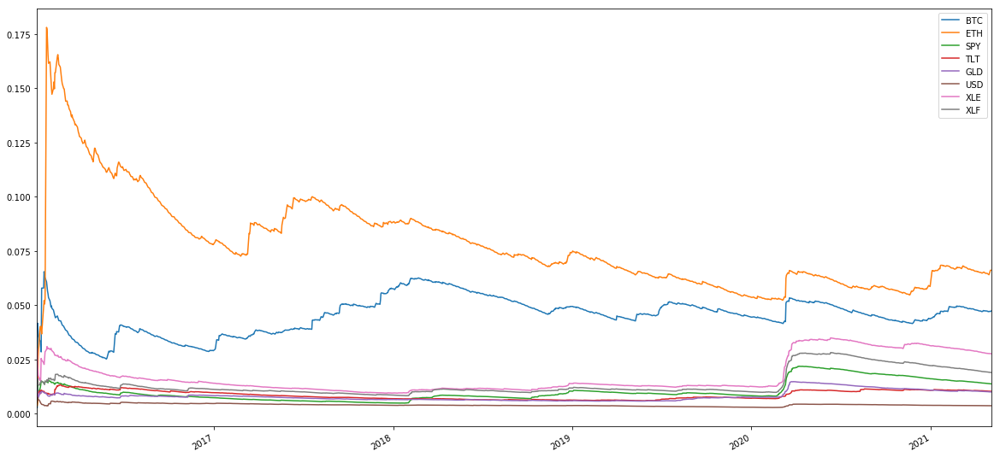

In [25]:
portfolio_returns.ewm(halflife=120).std().plot(figsize=(20, 10))

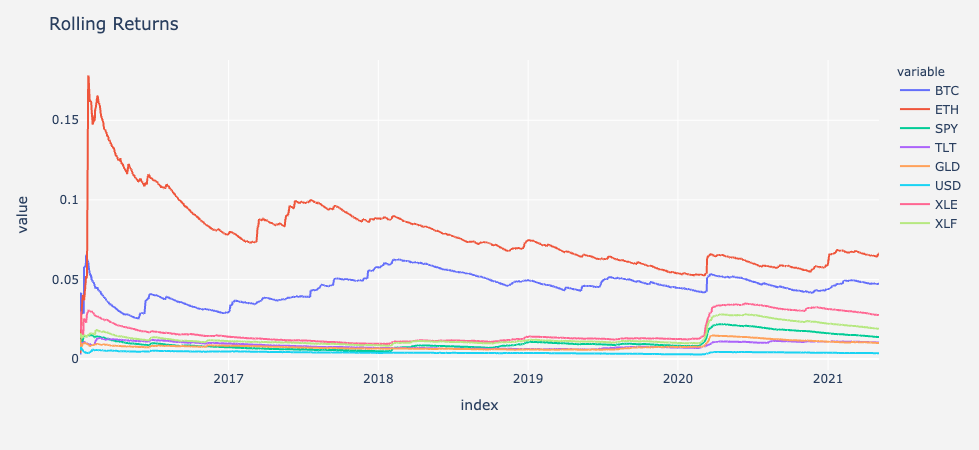

In [26]:
roll_120_line_fig = px.line(ewm_calc)
roll_120_line_fig.update_layout(
    title='Rolling Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
roll_120_line_fig.show()

In [27]:
# Annualized Sharpe Ratios
sharpe_ratios = (portfolio_returns.mean() * 252) / (portfolio_returns.std() * np.sqrt(252))
sharpe_ratios['BTC']


1.6089747589618075

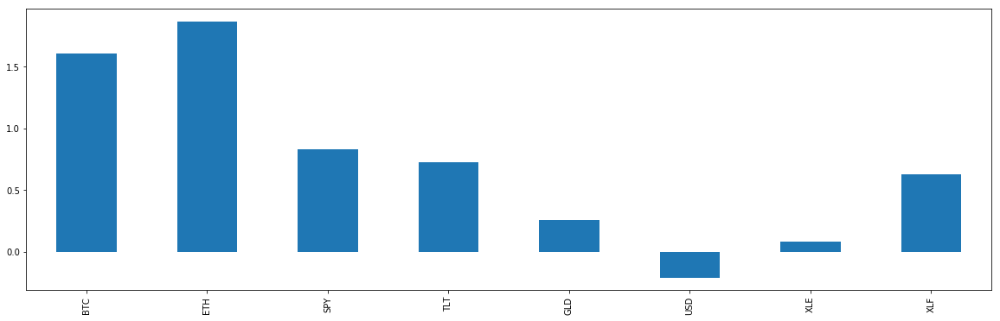

In [28]:
# Visualize the sharpe ratios as a bar plot
sharpe_ratios.plot(kind='bar',figsize=(20,6))

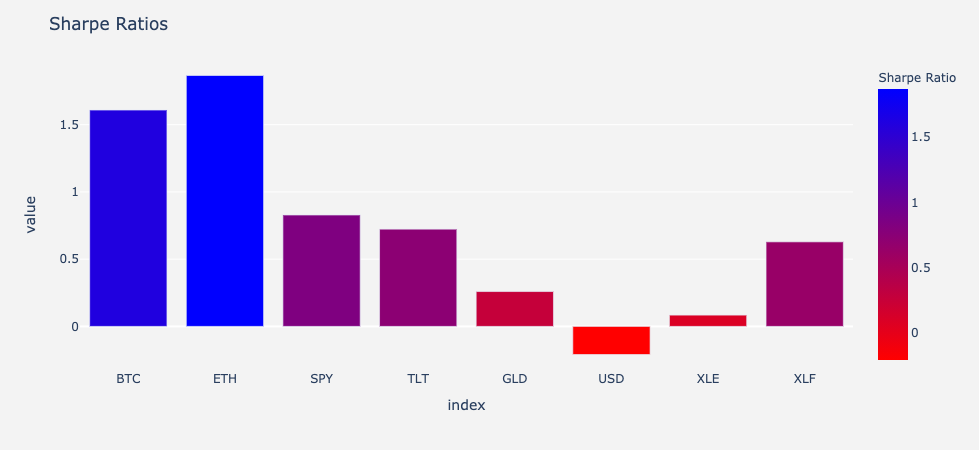

In [29]:
sharpe_bar_fig = px.bar(sharpe_ratios,labels=dict(x="Assets", y="Sharpe Ratio", color="Sharpe Ratio"),color = sharpe_ratios, color_continuous_scale='Bluered_r')
sharpe_bar_fig.update_layout(
    title='Sharpe Ratios',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
sharpe_bar_fig.show()

In [30]:
# Calculate and plot the correlation
price_correlation_new = portfolio_returns.corr()
# Display de correlation matrix
price_correlation_new

,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
BTC,1.000000,0.519841,0.151997,0.115408,-0.038046,-0.024193,0.124296,0.142190
ETH,0.519841,1.000000,0.134332,0.105430,-0.017121,-0.045281,0.102589,0.113738
SPY,0.151997,0.134332,1.000000,-0.006043,-0.389974,-0.026650,0.713741,0.862439
TLT,0.115408,0.105430,-0.006043,1.000000,0.332616,-0.450105,-0.023653,-0.142062
GLD,-0.038046,-0.017121,-0.389974,0.332616,1.000000,-0.143608,-0.337888,-0.497931
USD,-0.024193,-0.045281,-0.026650,-0.450105,-0.143608,1.000000,-0.051125,0.017659
XLE,0.124296,0.102589,0.713741,-0.023653,-0.337888,-0.051125,1.000000,0.765009
XLF,0.142190,0.113738,0.862439,-0.142062,-0.497931,0.017659,0.765009,1.000000


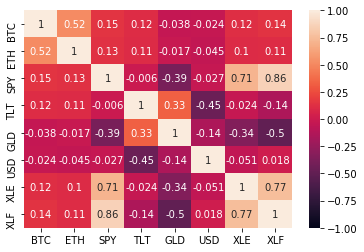

In [31]:
sns.heatmap(price_correlation_new, vmin=-1, vmax=1,annot=True)

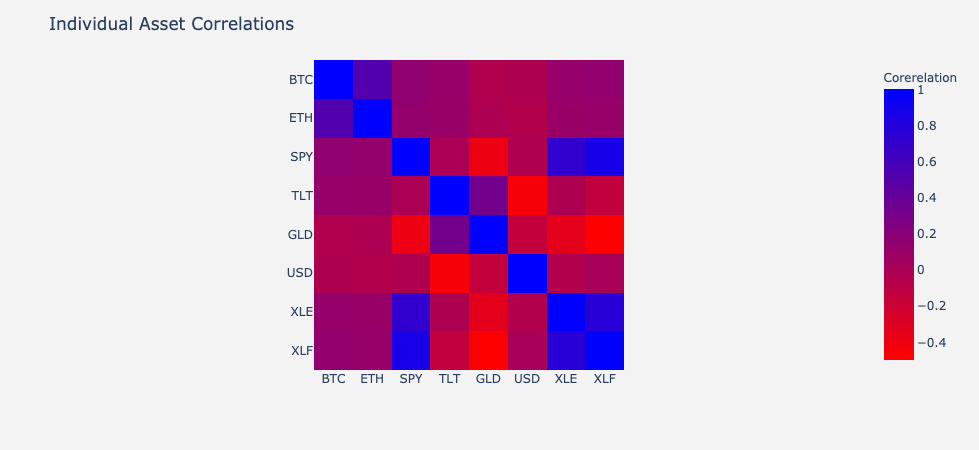

In [32]:
heatmap_fig = px.imshow(price_correlation_new, color_continuous_scale='Bluered_r', labels = dict(color='Corerelation'))
heatmap_fig.update_layout(
    title='Individual Asset Correlations',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
heatmap_fig.show()

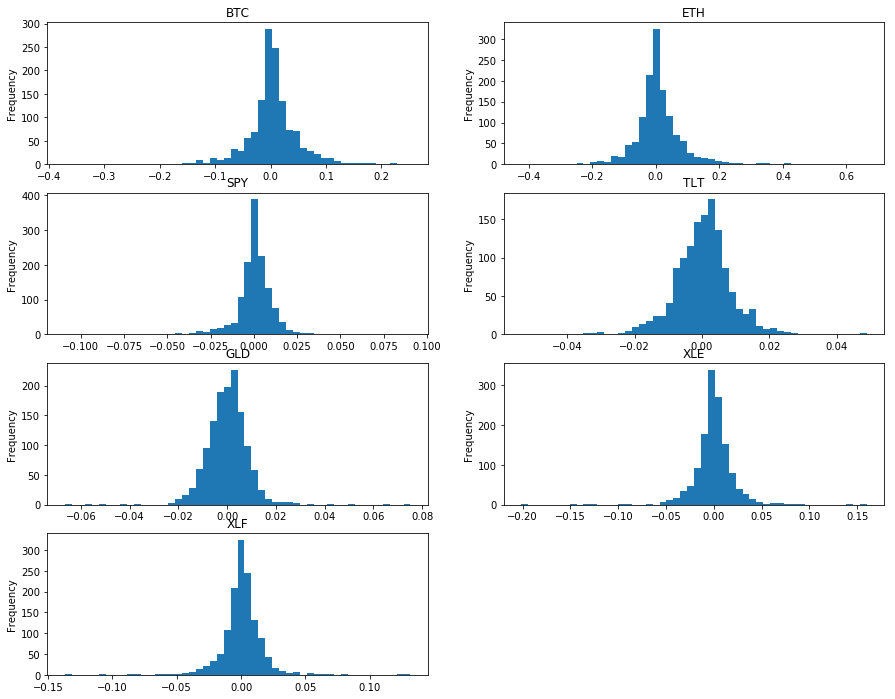

In [33]:
# Distribution Histogram

portfolio_returns.plot.hist(stacked=True, bins=100)

plt.subplot(4, 2, 1)
portfolio_returns['BTC'].plot.hist(bins = 50,figsize=(15,12))
plt.title('BTC')

  
plt.subplot(4, 2, 2)
portfolio_returns['ETH'].plot.hist(bins = 50)
plt.title('ETH')
  
plt.subplot(4, 2, 3)
portfolio_returns['SPY'].plot.hist(bins = 50)
plt.title('SPY')

plt.subplot(4, 2, 4)
portfolio_returns['TLT'].plot.hist(bins = 50)
plt.title('TLT')

plt.subplot(4, 2, 5)
portfolio_returns['GLD'].plot.hist(bins = 50)
plt.title('GLD')

plt.subplot(4, 2, 6)
portfolio_returns['XLE'].plot.hist(bins = 50)
plt.title('XLE')

plt.subplot(4, 2, 7)
portfolio_returns['XLF'].plot.hist(bins = 50)
plt.title('XLF')

  
plt.show()



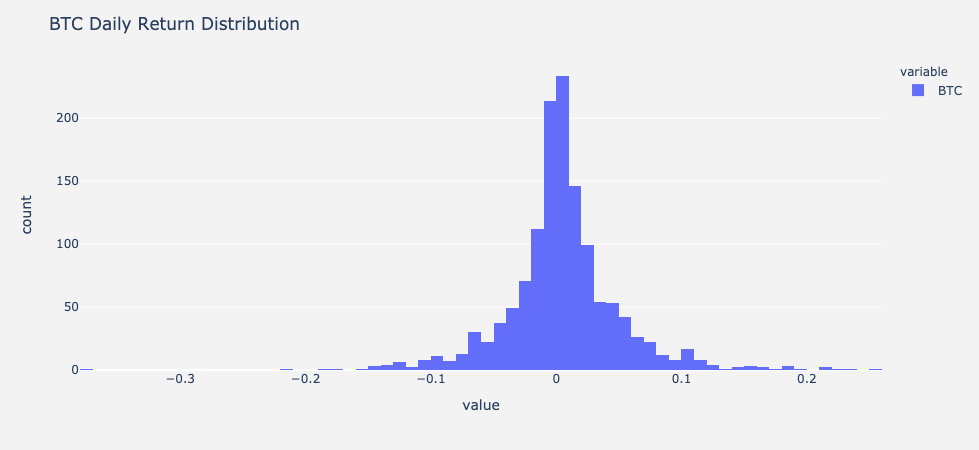

In [34]:
histogram_fig = px.histogram(portfolio_returns['BTC'])
histogram_fig.update_layout(
    title='BTC Daily Return Distribution',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True,
    barmode = 'stack'
)
histogram_fig.show()

In [35]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0,0,0.50,0.40,0.05,0.05,0,0]

# Calculate portfolio return

traditional_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

traditional_portfolio.dropna()

# Display sample data
traditional_portfolio.head()

2016-01-05    0.002039
2016-01-06    0.000032
2016-01-07   -0.006734
2016-01-08   -0.006873
2016-01-11   -0.003514
dtype: float64

In [36]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.10,0,0.50,0.40,0,0,0,0]

# Calculate portfolio return

btc_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

btc_portfolio.dropna()

# Display sample data
btc_portfolio.head()

2016-01-05    0.001712
2016-01-06   -0.001192
2016-01-07    0.000405
2016-01-08   -0.008311
2016-01-11   -0.004122
dtype: float64

In [37]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.00,0.10,0.50,0.40,0.00,0.00,0.00,0.00]

# Calculate portfolio return

eth_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

eth_portfolio.dropna()

# Display sample data
eth_portfolio.head()

2016-01-05    0.001522
2016-01-06   -0.000459
2016-01-07   -0.007271
2016-01-08   -0.002505
2016-01-11    0.004518
dtype: float64

In [38]:
# Set weights
column = ['BTC', 'ETH', 'SPY', 'TLT', 'GLD', 'USD', 'XLE', 'XLF']

weights = [0.09,0.09,0.32,0.29,0.20,0,0,0]

# Calculate portfolio return

alpha_portfolio = portfolio_returns.dot(weights)
# portfolio_returns_new.set_index('Date')

alpha_portfolio.dropna()

# Display sample data
alpha_portfolio.head()

2016-01-05   -0.000089
2016-01-06    0.002316
2016-01-07    0.002014
2016-01-08   -0.000569
2016-01-11    0.001418
dtype: float64

In [39]:
# Create daily returns of all portfolios
column = ['Traditional Portfolio', 'Bitcoin Portfolio', 'Etherium Portfolio', 'Alpha Andre Blend']

combined_returns = pd.concat([traditional_portfolio, btc_portfolio, eth_portfolio, alpha_portfolio], axis="columns", join="inner")
combined_returns.columns = column
combined_returns.head()

,Traditional Portfolio,Bitcoin Portfolio,Etherium Portfolio,Alpha Andre Blend
2016-01-05,0.002039,0.001712,0.001522,-0.000089
2016-01-06,0.000032,-0.001192,-0.000459,0.002316
2016-01-07,-0.006734,0.000405,-0.007271,0.002014
2016-01-08,-0.006873,-0.008311,-0.002505,-0.000569
2016-01-11,-0.003514,-0.004122,0.004518,0.001418


In [40]:
# Calculate cumulative returns of all portfolios
traditional_cum = (1 + traditional_portfolio).cumprod()
btc_cum = (1 + btc_portfolio).cumprod()
eth_cum = (1 + eth_portfolio).cumprod()
alpha_cum = (1 + alpha_portfolio).cumprod()

column = ['Traditional Portfolio', 'Bitcoin Portfolio', 'Etherium Portfolio', 'Alpha Andre Blend']

combined_portfolios = pd.concat([traditional_cum, btc_cum, eth_cum, alpha_cum], axis="columns", join="inner")
combined_portfolios.columns = column
combined_portfolios.head()

,Traditional Portfolio,Bitcoin Portfolio,Etherium Portfolio,Alpha Andre Blend
2016-01-05,1.002039,1.001712,1.001522,0.999911
2016-01-06,1.002072,1.000518,1.001063,1.002227
2016-01-07,0.995324,1.000923,0.993784,1.004246
2016-01-08,0.988483,0.992605,0.991294,1.003675
2016-01-11,0.985010,0.988513,0.995773,1.005098


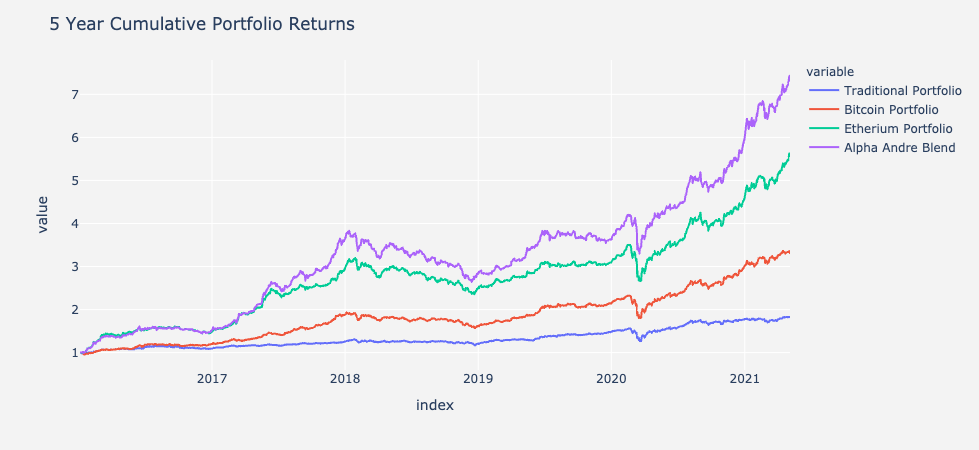

In [41]:
# Plot cumulative returns
# cumulative_returns.plot(figsize=(20,10), title="Cumulative Portfolio Returns")

cum_returns = px.line(combined_portfolios)
cum_returns.update_layout(
    title='5 Year Cumulative Portfolio Returns',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
cum_returns.show()

In [42]:
portfolio_sharpe_ratios = (combined_returns.mean() * 252) / (combined_returns.std() * np.sqrt(252))
portfolio_sharpe_ratios

Traditional Portfolio    1.113680
Bitcoin Portfolio        1.665065
Etherium Portfolio       1.952411
Alpha Andre Blend        2.164754
dtype: float64

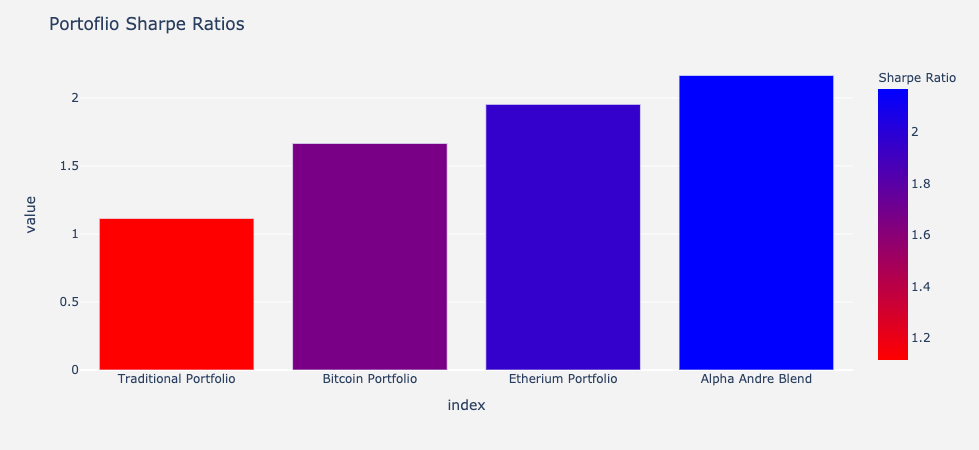

In [43]:
portfolio_sharpe_fig = px.bar(portfolio_sharpe_ratios,labels=dict(x="Assets", y="Sharpe Ratio", color="Sharpe Ratio"),color = portfolio_sharpe_ratios, color_continuous_scale='Bluered_r')
portfolio_sharpe_fig.update_layout(
    title='Portoflio Sharpe Ratios',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
portfolio_sharpe_fig.show()

In [44]:
monte_carlo_df = combined_df.dropna()

In [45]:
monte_carlo_df.to_csv('data/monte_carlo_dataframe.csv')

In [46]:
index_names = [
["BTC", "ETH", "SPY", "TLT", "GLD", "USD", "XLE", "XLF"],
["close", "close","close","close","close","close","close","close"]
]
index_tuples = list(zip(*index_names))
new_index = pd.MultiIndex.from_tuples(index_tuples,names=["first", "second"])
monte_carlo_df.columns = new_index

In [47]:
monte_carlo_df.head()

first,BTC,ETH,SPY,TLT,GLD,USD,XLE,XLF
second,close,close,close,close,close,close,close,close
2016-01-04,433.091003,0.954480,201.020004,102.889999,121.449997,98.870003,60.299999,18.984566
2016-01-05,431.959991,0.950176,201.360001,103.180000,120.959999,99.400002,60.529999,19.057676
2016-01-06,429.105011,0.950860,198.820007,104.669998,122.589996,99.180000,58.200001,18.765232
2016-01-07,458.048004,0.942005,194.050003,106.150002,122.809998,98.220001,56.779999,18.237206
2016-01-08,453.230011,0.986789,191.919998,105.680000,123.360001,98.540001,56.049999,17.952885


In [48]:
mc_traditional = MCSimulation(
    monte_carlo_df,
    weights = [0,0,0.50,0.40,0.05,0.05,0,0],
    num_simulation = 200,
    num_trading_days = 252*5
)

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.


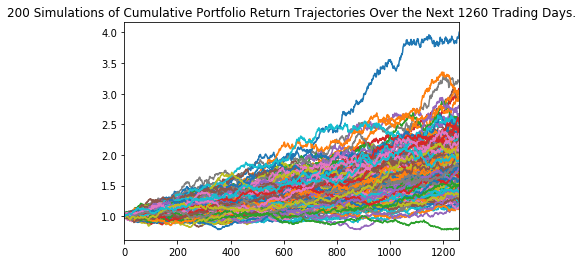

In [49]:
mc_traditional_plot = mc_traditional.plot_simulation()

In [50]:
mc_trad_fig = px.line(mc_trad_px)
mc_trad_fig.update_layout(
    title='Traditional Portfolio Monte Carlo Simulation',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
mc_trad_fig.show()

NameError: name 'mc_trad_px' is not defined

In [ ]:
mc_trad_tbl_5yr = mc_traditional.summarize_cumulative_return()

print(mc_trad_tbl_5yr)

In [ ]:
# Set initial investment
initial_investment = 1000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $1,000
ci_lower = round(mc_trad_tbl_5yr[8]*initial_investment,2)
ci_upper = round(mc_trad_tbl_5yr[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

In [ ]:
mc_btc_port = MCSimulation(
    monte_carlo_df,
    weights = [0.10,0,0.50,0.40,0,0,0,0],
    num_simulation = 200,
    num_trading_days = 252*5
)

In [ ]:
mc_btc_px = mc_btc_port.calc_cumulative_return()

In [ ]:
mc_btc_port_plot = mc_btc_port.plot_simulation()

In [ ]:
mc_btc_fig = px.line(mc_btc_px)
mc_btc_fig.update_layout(
    title='Bitcoin Portfolio Monte Carlo Simulation',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
mc_btc_fig.show()

In [ ]:
mc_btc_tbl_5yr = mc_btc_port.summarize_cumulative_return()

print(mc_btc_tbl_5yr)

In [ ]:
# Set initial investment
initial_investment = 1000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $1,000
ci_lower = round(mc_btc_tbl_5yr[8]*initial_investment,2)
ci_upper = round(mc_btc_tbl_5yr[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

In [ ]:
mc_eth_port = MCSimulation(
    monte_carlo_df,
    weights = [0,0.10,0.50,0.40,0,0,0,0],
    num_simulation = 200,
    num_trading_days = 252*5
)

In [ ]:
mc_eth_px = mc_eth_port.calc_cumulative_return()

In [ ]:
mc_eth_port_plot = mc_eth_port.plot_simulation()

In [ ]:
mc_eth_fig = px.line(mc_eth_px)
mc_eth_fig.update_layout(
    title='Traditional Portfolio Monte Carlo Simulation',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
mc_eth_fig.show()

In [ ]:
mc_eth_tbl_5yr = mc_eth_port.summarize_cumulative_return()

print(mc_eth_tbl_5yr)

In [ ]:
# Set initial investment
initial_investment = 1000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $1,000
ci_lower = round(mc_eth_tbl_5yr[8]*initial_investment,2)
ci_upper = round(mc_eth_tbl_5yr[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

In [ ]:
mc_andre_alpha_blend = MCSimulation(
    monte_carlo_df,
    weights = [0.09,0.09,0.32,0.29,0.20,0,0,0],
    num_simulation = 200,
    num_trading_days = 252*5
)

In [ ]:
mc_alpha_px = mc_andre_alpha_blend.calc_cumulative_return()

In [ ]:
mc_andre_alpha_blend_plot = mc_andre_alpha_blend.plot_simulation()

In [ ]:
mc_alpha_fig = px.line(mc_alpha_px)
mc_alpha_fig.update_layout(
    title='Traditional Portfolio Monte Carlo Simulation',
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=True
)
mc_alpha_fig.show()

In [ ]:
mc_alpha_tbl_5yr = mc_andre_alpha_blend.summarize_cumulative_return()

print(mc_alpha_tbl_5yr)

In [ ]:
# Set initial investment
initial_investment = 1000

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $1,000
ci_lower = round(mc_alpha_tbl_5yr[8]*initial_investment,2)
ci_upper = round(mc_alpha_tbl_5yr[9]*initial_investment,2)

# Print results
print(f"There is a 95% chance that an initial investment of ${initial_investment} in the portfolio"
      f" over the next 5 years will end within in the range of"
      f" ${ci_lower} and ${ci_upper}")

In [ ]:
overview_row = pn.Row(cum_returns,portfolio_sharpe_fig)

In [ ]:
trad_row = pn.Row(mc_trad_fig)

In [ ]:
btc_row = pn.Row(mc_btc_fig)

In [ ]:
eth_row = pn.Row(mc_eth_fig)

In [ ]:
alpha_row = pn.Row(mc_alpha_fig)

In [ ]:
overview_column = pn.Column(
    '# How Does Each Portfolio Stack Up?',
    overview_row

)

In [ ]:
trad_column = pn.Column(
    '# Traditional Portfolio',
    trad_row

)

In [ ]:
btc_column = pn.Column(
    '# Bitcoin Portfolio',
    btc_row

)

In [ ]:
eth_column = pn.Column(
    '# Etherium Portfolio',
    eth_row

)

In [ ]:
alpha_column = pn.Column(
    '# Alpha Portfolio',
    alpha_row

)

In [ ]:
vol_row = pn.Row(vol_box_fig,volatility_fig,port_returns_fig)

In [ ]:
roll_row = pn.Row(roll_120_fig,roll_120_line_fig)

In [ ]:
sharpe_row = pn.Row(histogram_fig,sharpe_bar_fig)

In [ ]:
heatmap_row = pn.Row(heatmap_fig)

In [ ]:
vol_column = pn.Column(
    '# At a Glance - Volatility of Assets',
    vol_row

)


In [ ]:
roll_column = pn.Column(
    '# At a Glance - Rolling 21 Day Average of Assets',
    roll_row

)


In [ ]:
sharpe_column = pn.Column(
    '# At a Glance - Sharpe Ratios of Each Asset',
    sharpe_row

)


In [ ]:
heat_column = pn.Column(
    '# Heatmap Correlations Related to Each Asset',
    heatmap_row
    
)


In [ ]:
tabs = pn.Tabs(
    ("Traditional Portfolio", trad_column),
    ("Bitcoin Portfolio", btc_column),
    ("Etherium Portfolio", eth_column),
    ("Alpha Portfolio",alpha_column),
    ("Conculsion", overview_column),
    ("Volatility",vol_column),
    ("Rolling Averages",roll_column),
    ("Sharpe Ratios",sharpe_column),
    ("Heatmap",heat_column)
)

tabs

In [ ]:
tabs.show()

In [ ]:
portfolio_returns

In [ ]:
#Efficient Frontier
#Dataframe for Efficient Frontier Calc.
df2 = portfolio_returns
df=portfolio_returns
# Calculate annualized average return for each stock. Annualized average return = Daily average return * 252 business days.
r = np.mean(df,axis=0)*252

# Create a covariance matrix
covar = df.cov()

In [ ]:
#Define frequently used functions.
# r is each stock's return, w is the portion of each stock in our portfolio, and covar is the covariance matrix
# Rate of return
def ret(r,w):
    return r.dot(w)
# Risk level - or volatility
def vol(w,covar):
    return np.sqrt(np.dot(w,np.dot(w,covar)))
def sharpe (ret,vol):
    return ret/vol

In [ ]:
# All weights, of course, must be between 0 and 1. Thus we set 0 and 1 as the boundaries.
from scipy.optimize import Bounds
bounds = Bounds(0, 1)

# The second boundary is the sum of weights.
from scipy.optimize import LinearConstraint
linear_constraint = LinearConstraint(np.ones((df2.shape[1],), dtype=int),1,1)

# Find a portfolio with the minimum risk.
from scipy.optimize import minimize
#Create x0, the first guess at the values of each stock's weight.
weights = np.ones(df2.shape[1])
x0 = weights/np.sum(weights)
#Define a function to calculate volatility
fun1 = lambda w: np.sqrt(np.dot(w,np.dot(w,covar)))
res = minimize(fun1,x0,method='trust-constr',constraints = linear_constraint,bounds = bounds)

#These are the weights of the stocks in the portfolio with the lowest level of risk possible.
w_min = res.x

np.set_printoptions(suppress = True, precision=2)
print(w_min)
print('return: % .2f'% (ret(r,w_min)*100), 'risk: % .3f'% vol(w_min,covar))

In [ ]:
#Define 1/Sharpe_ratio
fun2 = lambda w: np.sqrt(np.dot(w,np.dot(w,covar)))/r.dot(w)
res_sharpe = minimize(fun2,x0,method='trust-constr',constraints = linear_constraint,bounds = bounds)

#These are the weights of the stocks in the portfolio with the highest Sharpe ratio.
w_sharpe = res_sharpe.x
print(w_sharpe)
print('return: % .2f'% (ret(r,w_sharpe)*100), 'risk: % .3f'% vol(w_sharpe,covar))

In [ ]:
w = w_min
num_ports = 100
gap = (np.amax(r) - ret(r,w_min))/num_ports


all_weights = np.zeros((num_ports, len(df.columns)))
all_weights[0],all_weights[1]=w_min,w_sharpe
ret_arr = np.zeros(num_ports)
ret_arr[0],ret_arr[1]=ret(r,w_min),ret(r,w_sharpe)
vol_arr = np.zeros(num_ports)
vol_arr[0],vol_arr[1]=vol(w_min,covar),vol(w_sharpe,covar)

for i in range(num_ports):
    port_ret = ret(r,w) + i*gap
    double_constraint = LinearConstraint([np.ones(df2.shape[1]),r],[1,port_ret],[1,port_ret])
    
    #Create x0: initial guesses for weights.
    x0 = w_min
    #Define a function for portfolio volatility.
    fun = lambda w: np.sqrt(np.dot(w,np.dot(w,covar)))
    a = minimize(fun,x0,method='trust-constr',constraints = double_constraint,bounds = bounds)
    
    all_weights[i,:]=a.x
    ret_arr[i]=port_ret
    vol_arr[i]=vol(a.x,covar)
    
sharpe_arr = ret_arr/vol_arr  

plt.figure(figsize=(10,5))
plt.scatter(vol_arr, ret_arr, c=sharpe_arr, cmap='viridis')
plt.colorbar(label='Sharpe Ratio')
plt.xlabel('Volatility')
plt.ylabel('Return')
plt.show()

In [ ]:
#twilio

In [ ]:
from yahoo_fin import stock_info as si
from yahoo_fin.stock_info import get_data
from datetime import date
from datetime import timedelta
import os
from twilio.rest import Client

account_sid = ''
auth_token = ''
client = Client(account_sid, auth_token)

In [ ]:
today = date.today()

In [ ]:
yesterday = today - timedelta(days = 5)

In [ ]:
yesterday

In [ ]:
btc = get_data("btc", start_date=yesterday, end_date=today, index_as_date = True, interval="1d")

In [ ]:
btc

In [ ]:
si.get_live_price("btc")

In [ ]:
last = btc['close'].tail(-1).iloc[0]

In [ ]:
last

In [ ]:
btc['close'].tail(1).iloc[0]

In [ ]:
now = si.get_live_price("btc")

In [ ]:
now

In [ ]:
if now < last:
    message = client.messages \
                .create(
                     body="buy",
                     from_='phone-sender',
                     to='phone'
                 )
    print(message.sid)
else:
    message = client.messages \
                .create(
                     body="sell",
                     from_='phone-sender',
                     to='phone'
                 )
    print(message.sid)
    